# Set maximum number of objects and/or minimum distance for assets with random pose engine

In this example three use-cases are demonstrated regarding the random pose engine when placing objects into a workspace:

* setting a maximum number of assets to be placed by the random pose engine in the workspace
* setting a maximum number of assets **and** a minimum distance between assets
* setting no maximum number of assets 
* setting no maximum number of assets **but** setting a minimum distance between the assets added to the world

This can also be used with the model group generator.

In [1]:
%matplotlib inline
import warnings

warnings.filterwarnings("ignore")
                        
import os
import numpy as np
import matplotlib.pyplot as plt

from pcg_gazebo.visualization import plot_workspace, plot_shapely_geometry
from pcg_gazebo.simulation import SimulationModel
from pcg_gazebo.generators import WorldGenerator
from pcg_gazebo.generators.shapes import random_rectangles
from pcg_gazebo.generators.creators import extrude

world_gen = WorldGenerator()

wall_thickness = 0.15
wall_height = 2

line 93.
line 104.
line 105.
line 109.
line 111.
line 109.
line 111.
line 106.
line 107.
line 109.
line 111.
line 109.
line 111.
line 108.
line 94.
line 101.
line 102.
line 104.
line 107.
line 109.
line 111.
line 109.
line 111.
line 108.
line 103.
line 95.
line 96.
line 88.
line 89.
default
line 90.
line 91.
line 92.


First, create walls to limit the workspace where the objects will be added to the world

In [2]:
wall_polygon = random_rectangles(
    n_rect=5, delta_x_min=10, delta_x_max=15, delta_y_min=10, delta_y_max=15)

walls_model = extrude(
    polygon=wall_polygon,
    thickness=wall_thickness,
    height=wall_height,
    pose=[0, 0, wall_height / 2., 0, 0, 0],
    extrude_boundaries=True,
    color='xkcd')
walls_model.name = 'walls'
walls_model.create_scene().show()

Create a function to reset the world with the wall model and a ground plane to be called when the world is regenerated.

In [3]:
def reset_world():
    # Reset world generator
    world_gen.init()
    world_gen.engines.reset()

    # Add walls and ground plane to the world
    world_gen.world.add_model(
        tag=walls_model.name,
        model=walls_model)
    world_gen.world.add_model(
        tag='ground_plane',
        model=SimulationModel.from_gazebo_model('ground_plane'))

reset_world()
world_gen.world.create_scene().show()

line 89.
default
line 90.
line 91.
line 92.
line 57.
default
line 59.
default
line 58.
line 60.
line 62.
walls
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 63.
line 64.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 58.
line 60.
line 62.
ground_plane
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 63.
line 64.
line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 56.
line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69

Compute free-space polygon to add as a workspace constraint to the random pose engine.

line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 56.
line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 56.
line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.

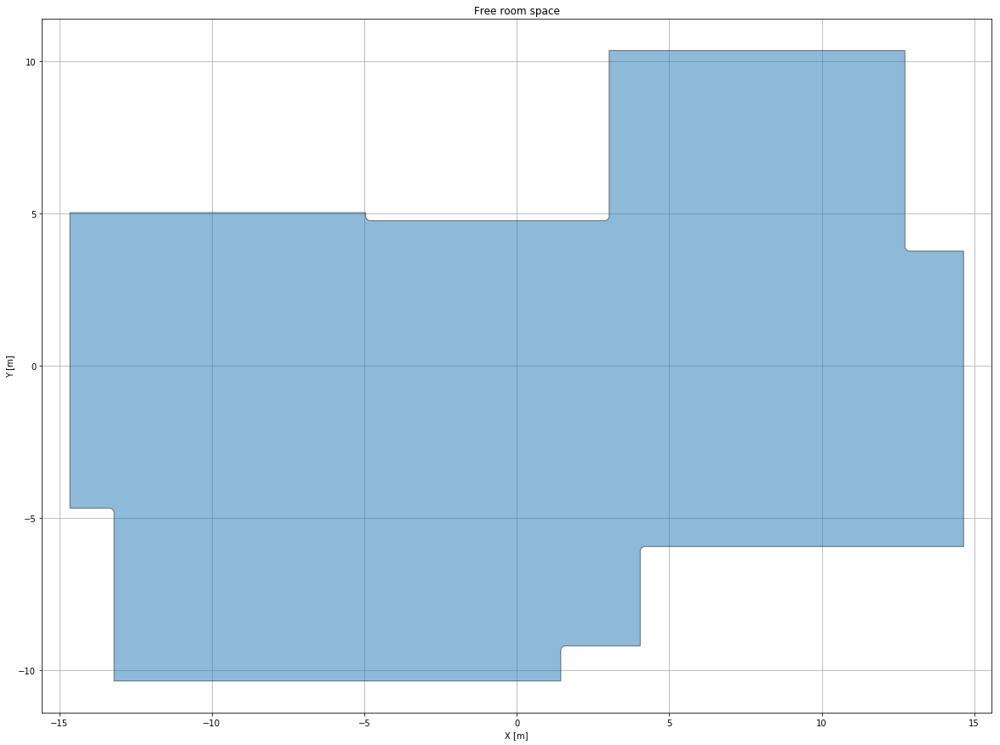

In [4]:
free_space_polygon = world_gen.world.get_free_space_polygon(
    ground_plane_models=[walls_model.name],
    ignore_models=['ground_plane'])

fig, ax = plot_shapely_geometry(free_space_polygon)

ax.set_xlabel('X [m]')
ax.set_ylabel('Y [m]')
ax.set_title('Free room space')
plt.show()

Add a workspace and a tangent constraint.

In [5]:
# Add constraint to place all object
# tangent to the ground
world_gen.add_constraint(
    name='tangent_to_ground_plane',
    type='tangent',
    frame='world',
    reference=dict(
        type='plane',
        args=dict(
            origin=[0, 0, 0],
            normal=[0, 0, 1]
        )
    )
)

world_gen.add_constraint(
    name='room_workspace',
    type='workspace',
    frame='world',
    geometry_type='polygon',
    polygon=free_space_polygon
)

print('List of constraints = ', world_gen.constraints.tags)

List of constraints =  ['tangent_to_ground_plane', 'room_workspace']


Add assets that will be dynamically generated when called by the random pose engine while populating the workspace.

In [6]:
# Add assets to the assets manager
world_gen.add_asset(
    tag='box',
    description=dict(
        type='box',
        args=dict(
            size="3 * __import__('pcg_gazebo').random.uniform(0.1, 1, 3)",
            name='cuboid',
            color='xkcd'
        )
    )
)

world_gen.add_asset(
    tag='cylinder',
    description=dict(
        type='cylinder',
        args=dict(
            radius="2 * __import__('pcg_gazebo').random.uniform(0.1, 1)",
            length="2 * __import__('pcg_gazebo').random.uniform(0.1, 1)",
            name='cylinder',
            color='xkcd'
        )
    )
)

world_gen.add_asset(
    tag='sphere',
    description=dict(
        type='sphere',
        args=dict(
            radius="2 * __import__('pcg_gazebo').random.uniform(0.1, 1)",
            name='sphere',
            color='xkcd'
        )
    )
)

line 111.
line 111.
line 111.


True

## Setting maximum number of assets to add to world

In case the max. number of assets is set, the random pose engine will stop trying to place new assets to the world either when the maximum number of assets is reached or when there is no more collision-free room to add objects.

In [7]:
placement_policy = dict(
    models=['box', 'cylinder', 'sphere'],
    config=[
        dict(
            dofs=['x', 'y'],            
            tag='workspace',
            workspace='room_workspace'
        ),
        dict(
            dofs=['yaw'],            
            tag='uniform',                            
            min=-3.141592653589793,
            max=3.141592653589793               
        )
    ]
)

# Max. number of each asset as stopping criteria to the random pose engine
max_num=dict(
    box=4,
    cylinder=4,
    sphere=4)

world_gen.add_engine(
    tag='object_placement',
    engine_name='random_pose',
    models=['box', 'cylinder', 'sphere'],
    max_num=max_num,
    model_picker='random',
    no_collision=True,
    policies=[placement_policy],
    constraints=[
        dict(
            model='box',
            constraint='tangent_to_ground_plane'),
        dict(
            model='cylinder',
            constraint='tangent_to_ground_plane'),
        dict(
            model='sphere',
            constraint='tangent_to_ground_plane')
    ]
)

True

In [8]:
world_gen.run_engines(attach_models=True)

line 1.
line 2.
line 3.
line 4.
line 5.
line 6.
line 7.
object_placement
line 8.
<class 'pcg_gazebo.generators.engines.random_pose_engine.RandomPoseEngine'>
line 9.
line 14.
line 15.
line 16.
line 17.
line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 56.
line 18.
line 18.
line 19.
line 37.
line 38.
line 39.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 40.
line 49.
line 37.
line 38.
line 39.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 40.
line 49.
line 37.
line 38.
line 39.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 40.
line 49.
line 37.
line 38.
line 39.


True

In [9]:
print('List of models ({}) = {}'.format(
    len(world_gen.world.models.keys()), world_gen.world.models.keys()))

line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
lin

In [12]:
print(world_gen.engines.tags)
world_gen.world.create_scene().show()

['object_placement']
line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.


## Setting maximum amount of assets and a minimum distance

In this use-case, the objects will be placed within the workspace only if the minimum distance to all other objects in the scene can also be respected.

In [13]:
reset_world()

line 89.
default
line 90.
line 91.
line 92.
line 57.
default
line 59.
default
line 58.
line 60.
line 62.
walls
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 63.
line 64.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 58.
line 60.
line 62.
ground_plane
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 63.
line 64.


In [14]:
MIN_DISTANCE = 1

world_gen.add_engine(
    tag='object_placement',
    engine_name='random_pose',
    models=['box', 'cylinder', 'sphere'],
    max_num=max_num,
    model_picker='random',
    no_collision=True,
    policies=[placement_policy],
    min_distance=MIN_DISTANCE,
    constraints=[
        dict(
            model='box',
            constraint='tangent_to_ground_plane'),
        dict(
            model='cylinder',
            constraint='tangent_to_ground_plane'),
        dict(
            model='sphere',
            constraint='tangent_to_ground_plane')
    ]
)

True

In [15]:
world_gen.run_engines(attach_models=True)

line 1.
line 2.
line 3.
line 4.
line 5.
line 6.
line 7.
object_placement
line 8.
<class 'pcg_gazebo.generators.engines.random_pose_engine.RandomPoseEngine'>
line 9.
line 14.
line 15.
line 16.
line 17.
line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 56.
line 18.
line 18.
line 19.
line 37.
line 38.
line 39.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 40.
line 49.
line 37.
line 38.
line 39.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 40.
line 49.
line 37.
line 38.
line 39.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 40.
line 49.
line 37.
line 38.
line 39.


True

In [16]:
print('List of models ({}) = {}'.format(
    len(world_gen.world.models.keys()), world_gen.world.models.keys()))

line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
lin

In [17]:
world_gen.world.create_scene().show()

line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
lin

## Setting no minimum amout of assets

In this case, the objects are placed until no free room is found within the workspace to place new objects.

In [18]:
reset_world()

line 89.
default
line 90.
line 91.
line 92.
line 57.
default
line 59.
default
line 58.
line 60.
line 62.
walls
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 63.
line 64.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 58.
line 60.
line 62.
ground_plane
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 63.
line 64.


In [19]:
world_gen.add_engine(
    tag='object_placement',
    engine_name='random_pose',
    models=['box', 'cylinder', 'sphere'],
    model_picker='random',
    no_collision=True,
    policies=[placement_policy],
    constraints=[
        dict(
            model='box',
            constraint='tangent_to_ground_plane'),
        dict(
            model='cylinder',
            constraint='tangent_to_ground_plane'),
        dict(
            model='sphere',
            constraint='tangent_to_ground_plane')
    ]
)

True

In [20]:
world_gen.run_engines(attach_models=True)

line 1.
line 2.
line 3.
line 4.
line 5.
line 6.
line 7.
object_placement
line 8.
<class 'pcg_gazebo.generators.engines.random_pose_engine.RandomPoseEngine'>
line 9.
line 14.
line 15.
line 16.
line 17.
line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 56.
line 18.
line 18.
line 19.
line 37.
line 38.
line 39.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 40.
line 49.
line 37.
line 38.
line 39.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 40.
line 49.
line 37.
line 38.
line 39.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 40.
line 49.
line 37.
line 38.
line 39.


True

In [21]:
print('List of models ({}) = {}'.format(
    len(world_gen.world.models.keys()), world_gen.world.models.keys()))

line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
li

In [22]:
world_gen.world.create_scene().show()

line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
li

## Setting no minimum amount of objects but a minimum distance between objects

As in the example before, objects will be placed within the workspace until no free room in the workspace or no room where the minimum distance can be respected.

In [23]:
reset_world()

line 89.
default
line 90.
line 91.
line 92.
line 57.
default
line 59.
default
line 58.
line 60.
line 62.
walls
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 63.
line 64.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 58.
line 60.
line 62.
ground_plane
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 63.
line 64.


In [24]:
world_gen.add_engine(
    tag='object_placement',
    engine_name='random_pose',
    models=['box', 'cylinder', 'sphere'],
    model_picker='random',
    no_collision=True,
    min_distance=MIN_DISTANCE,
    policies=[placement_policy],
    constraints=[
        dict(
            model='box',
            constraint='tangent_to_ground_plane'),
        dict(
            model='cylinder',
            constraint='tangent_to_ground_plane'),
        dict(
            model='sphere',
            constraint='tangent_to_ground_plane')
    ]
)

True

In [25]:
world_gen.run_engines(attach_models=True)

line 1.
line 2.
line 3.
line 4.
line 5.
line 6.
line 7.
object_placement
line 8.
<class 'pcg_gazebo.generators.engines.random_pose_engine.RandomPoseEngine'>
line 9.
line 14.
line 15.
line 16.
line 17.
line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 111.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 56.
line 18.
line 18.
line 19.
line 37.
line 38.
line 39.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 40.
line 49.
line 37.
line 38.
line 39.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 40.
line 49.
line 37.
line 38.
line 39.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 40.
line 49.
line 37.
line 38.
line 39.


True

In [26]:
print('List of models ({}) = {}'.format(
    len(world_gen.world.models.keys()), world_gen.world.models.keys()))

line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
li

In [ ]:
world_gen.world.create_scene().show()

line 54.
line 55.
default
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
line 73.
line 74.
line 66.
line 67.
line 85.
line 86.
line 65.
line 81.
line 82.
line 68.
line 69.
line 70.
line 71.
line 72.
li